# Introduction 
Using the CalEnviroScreen data set and the affordable housing projects data from Los Angeles Housing and Community Invesment Department, we map where in L.A County is affordable housing being built, and if there is an overlap with the areas of high environmental vulnerability and pollution exposure in the county.

# Getting Ready
we'll bring in all of our libraries that we need and then the Cal Envrio data, census tracts, and our affordable housing data.

## Import libraries 
These libraries help us explore our data and get it on maps

In [1]:
# for basic analysis on our data
import pandas as pd

# so we can analyze geographic data
import geopandas as gpd

# to plot things with plotly
import plotly.express as px
from sodapy import Socrata #NEW import!

# for nice basemaps
import contextily as ctx

# for interactive leaflet mapping
import folium


# to handle thousands of markers
from folium.plugins import MarkerCluster

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px


## LA census tracts

We'll start with our basic geojson [LA Census Trats](http://boundaries.latimes.com/set/census-tracts-2012/) file from the LA Times "Mapping L.A Boundaries" API dataset. This data set contains geometry for "statisical areas defined by the Census Bureau"

In [2]:
# Bring in the LA census tracts 
tracts= gpd.read_file('http://boundaries.latimes.com/1.0/boundary-set/census-tracts-2012/?format=geojson')
tracts.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,Census Tract (2012),06037101110,06037101110,06037101110-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2594737', 'NAME': '1011.10',...",/1.0/boundary/06037101110-census-tract-2012/,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,Census Tract (2012),06037101122,06037101122,06037101122-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2677213', 'NAME': '1011.22',...",/1.0/boundary/06037101122-census-tract-2012/,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,Census Tract (2012),06037101210,06037101210,06037101210-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2529724', 'NAME': '1012.10',...",/1.0/boundary/06037101210-census-tract-2012/,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,Census Tract (2012),06037101220,06037101220,06037101220-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2516085', 'NAME': '1012.20',...",/1.0/boundary/06037101220-census-tract-2012/,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,Census Tract (2012),06037101300,06037101300,06037101300-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2487732', 'NAME': '1013', 'I...",/1.0/boundary/06037101300-census-tract-2012/,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [3]:
#let's simplify it to just the columns we need
tracts_trimmed = tracts[['name','geometry']]
tracts_trimmed.head()

,name,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [4]:
# rename the columns
tracts_trimmed.columns = ['Census Tract','geometry']
tracts_trimmed.head()

,Census Tract,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


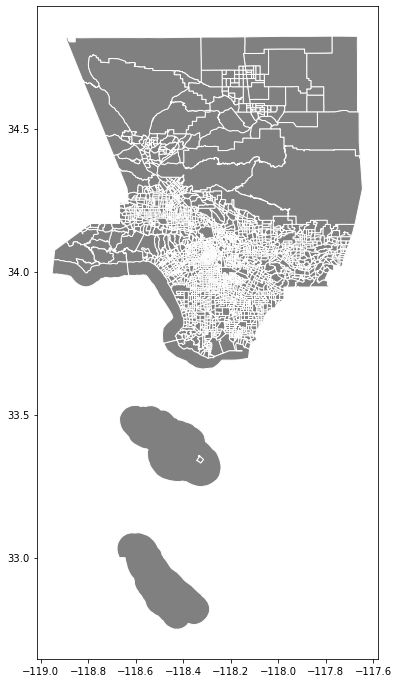

In [5]:
# Look at our map! Added an edge color to our census tracts borders
ax= tracts_trimmed.plot(figsize=(12,12), 
            color='grey', edgecolor='white')




## Cal Enviro data 

This data set includes an index created by the California Environmental Agency and the Office of Environmental Hazard to define areas who have high vulnerability to climate change and are  highly exposed to different types of pollutants. The areas with the highest index scores are designated as “Disadvantaged Communities”, and are used as targeted areas for investments that aim to improve public health, quality of life, and economic opportunity in California. For the purposes of this project we use the term “vulnerable areas” instead of “disadvantaged communities”. The reason is that we do not want to characterize the population or community as "disadvantaged". We assume that the lack of investment in these areas has been a result of zoning and historic racist practices that have resulted in the disproportionate pollution of areas where Black, Indigenous and Brown communities live. 

In [6]:
# import Cal Enviro Screen Data Set
cal_enviro= pd.read_csv('data/CalEnviro_LA_County.csv')

# Look at the first 10 rows to get a sense of what the data is telling us
cal_enviro.head(10)

,Census Tract,CalEnviroScreen\n3.0 Score,CalEnviroScreen 3.0 \nPercentile Range,Pollution Burden\nPercentile,Population Characteristics\nPercentile,Total Population,California County,Approximate Zip Code,Nearby City \n(to help approximate location only)
0,6019001100,94.09,95-100% (highest scores),99.95,99.70,3174,Fresno,93706,Fresno
1,6071001600,90.68,95-100% (highest scores),100.00,98.11,6133,San Bernardino,91761,Ontario
2,6019000200,85.97,95-100% (highest scores),99.00,99.99,3167,Fresno,93706,Fresno
3,6077000801,82.49,95-100% (highest scores),99.59,97.72,6692,San Joaquin,95203,Stockton
4,6019001500,82.03,95-100% (highest scores),99.99,92.76,2206,Fresno,93725,Fresno
5,6037204920,80.73,95-100% (highest scores),99.88,94.89,2598,Los Angeles,90023,Los Angeles
6,6077000300,80.18,95-100% (highest scores),98.07,99.65,2396,San Joaquin,95203,Stockton
7,6019001000,80.13,95-100% (highest scores),97.35,99.91,4106,Fresno,93706,Fresno
8,6037206050,79.03,95-100% (highest scores),99.90,92.96,2146,Los Angeles,90023,Los Angeles
9,6019000400,78.53,95-100% (highest scores),99.48,95.71,6343,Fresno,93721,Fresno


In [7]:
# This changes the census tract column to be imported as a string
cal_enviro['Census Tract'] = cal_enviro['Census Tract'].astype(str)

# And now we add the zero at the begining of the Census Tract Column
cal_enviro['Census Tract'] = cal_enviro['Census Tract'].str.zfill(11)

# Let's take a look to check that it worked
cal_enviro.head(10)

,Census Tract,CalEnviroScreen\n3.0 Score,CalEnviroScreen 3.0 \nPercentile Range,Pollution Burden\nPercentile,Population Characteristics\nPercentile,Total Population,California County,Approximate Zip Code,Nearby City \n(to help approximate location only)
0,06019001100,94.09,95-100% (highest scores),99.95,99.70,3174,Fresno,93706,Fresno
1,06071001600,90.68,95-100% (highest scores),100.00,98.11,6133,San Bernardino,91761,Ontario
2,06019000200,85.97,95-100% (highest scores),99.00,99.99,3167,Fresno,93706,Fresno
3,06077000801,82.49,95-100% (highest scores),99.59,97.72,6692,San Joaquin,95203,Stockton
4,06019001500,82.03,95-100% (highest scores),99.99,92.76,2206,Fresno,93725,Fresno
5,06037204920,80.73,95-100% (highest scores),99.88,94.89,2598,Los Angeles,90023,Los Angeles
6,06077000300,80.18,95-100% (highest scores),98.07,99.65,2396,San Joaquin,95203,Stockton
7,06019001000,80.13,95-100% (highest scores),97.35,99.91,4106,Fresno,93706,Fresno
8,06037206050,79.03,95-100% (highest scores),99.90,92.96,2146,Los Angeles,90023,Los Angeles
9,06019000400,78.53,95-100% (highest scores),99.48,95.71,6343,Fresno,93721,Fresno


In [8]:
cal_enviro.shape

(2007, 9)

In [9]:
# Now we want to just simplify the data to only look at Los Angeles
enviro_LA= cal_enviro[cal_enviro['California County']== 'Los Angeles']

# Let's look at the head to make sure it worked.
enviro_LA.head(10)

,Census Tract,CalEnviroScreen\n3.0 Score,CalEnviroScreen 3.0 \nPercentile Range,Pollution Burden\nPercentile,Population Characteristics\nPercentile,Total Population,California County,Approximate Zip Code,Nearby City \n(to help approximate location only)
5,06037204920,80.73,95-100% (highest scores),99.88,94.89,2598,Los Angeles,90023,Los Angeles
8,06037206050,79.03,95-100% (highest scores),99.90,92.96,2146,Los Angeles,90023,Los Angeles
14,06037205120,78.04,95-100% (highest scores),99.75,93.44,3618,Los Angeles,90023,Los Angeles
16,06037291220,77.50,95-100% (highest scores),99.96,88.16,3353,Los Angeles,90247,Gardena
20,06037239202,76.04,95-100% (highest scores),96.91,99.23,4724,Los Angeles,90001,Los Angeles
21,06037226002,76.04,95-100% (highest scores),99.83,90.38,1604,Los Angeles,90021,Los Angeles
27,06037535400,74.46,95-100% (highest scores),97.41,97.96,3495,Los Angeles,90002,Los Angeles
31,06037243100,73.54,95-100% (highest scores),94.35,99.68,5350,Los Angeles,90059,Los Angeles
32,06037543305,73.54,95-100% (highest scores),99.76,88.26,2666,Los Angeles,90220,Compton
34,06037204600,73.13,95-100% (highest scores),98.53,94.83,4101,Los Angeles,90023,Los Angeles


In [10]:
# Let's rename a few of these columns to get the weird \n out of there.
enviro_LA=enviro_LA.rename(columns={"CalEnviroScreen\n3.0 Score": "Score", 
                          "CalEnviroScreen 3.0 \nPercentile Range": "Percentile Range",
                          "Pollution Burden\nPercentile" : "Burden Percentile",
                          "Population Characteristics\nPercentile" : "Characteristcs Percentile",
                          "Total Population" : "Population",
                          "Nearby City \n(to help approximate location only)" : "Nearby City"
                         })

#check out the renamed columns
enviro_LA.head(10)

,Census Tract,Score,Percentile Range,Burden Percentile,Characteristcs Percentile,Population,California County,Approximate Zip Code,Nearby City
5,06037204920,80.73,95-100% (highest scores),99.88,94.89,2598,Los Angeles,90023,Los Angeles
8,06037206050,79.03,95-100% (highest scores),99.90,92.96,2146,Los Angeles,90023,Los Angeles
14,06037205120,78.04,95-100% (highest scores),99.75,93.44,3618,Los Angeles,90023,Los Angeles
16,06037291220,77.50,95-100% (highest scores),99.96,88.16,3353,Los Angeles,90247,Gardena
20,06037239202,76.04,95-100% (highest scores),96.91,99.23,4724,Los Angeles,90001,Los Angeles
21,06037226002,76.04,95-100% (highest scores),99.83,90.38,1604,Los Angeles,90021,Los Angeles
27,06037535400,74.46,95-100% (highest scores),97.41,97.96,3495,Los Angeles,90002,Los Angeles
31,06037243100,73.54,95-100% (highest scores),94.35,99.68,5350,Los Angeles,90059,Los Angeles
32,06037543305,73.54,95-100% (highest scores),99.76,88.26,2666,Los Angeles,90220,Compton
34,06037204600,73.13,95-100% (highest scores),98.53,94.83,4101,Los Angeles,90023,Los Angeles


In [11]:
enviro_LA.shape

(1038, 9)

In [12]:
#Columns
list(enviro_LA)

['Census Tract',
 'Score',
 'Percentile Range',
 'Burden Percentile',
 'Characteristcs Percentile',
 'Population',
 'California County',
 'Approximate Zip Code',
 'Nearby City']

## Affordable Housing Data

Now we import the data we will analyze: ["HCIDLA Affordable Housing Projects List (2003 to Present)"](https://data.lacity.org/A-Livable-and-Sustainable-City/HCIDLA-Affordable-Housing-Projects-List-2003-to-Pr/mymu-zi3s)

According to the data description, this data set includes: 
>"HCIDLA financed projects since 2003 to present. These projects are financed with programs including Affordable Housing Managed Pipeline, Supportive Housing Program, Affordable Housing Bond Program, and the Proposition HHH Supportive Housing Loan Program."


In [13]:
# read in a CSV file downloaded from the HCIDLA
hcid=pd.read_csv('https://data.lacity.org/resource/mymu-zi3s.csv')

# take a look at the first 5 rows to make sure it's 
hcid.head()

,apn,project_number,name,development_stage,construction_type,address,council_district,site_cd,community,site_units,...,management_company,contact_phone,photo,jobs,reporturl2,contract_numbers,date_stamp,longitude,latitude,geocoded_column
0,5131020009,05-117217,LEXINGTON APARTMENTS A/B (SITE 11),In-Service,REHAB,1145 E 24TH ST CA 90011,9,11,CENTRAL,0,...,"ALPHA PROPERTY MANAGEMENT, INC.",(323) 231-4174,click here (http://hcidapp.lacity.org/mpphotos...,NaN,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.25561,34.02133,POINT (-118.25561000000002 34.02133)
1,5059004029,70033,ROSA PARKS VILLAS,In-Service,NEW CONSTRUCTION,2440 S CRENSHAW BLVD CA 90018,10,1,WELLINGTON SQUARE,60,...,TELACU PROPERTY MANAGEMENT,(323) 721-1655,click here (http://hcidapp.lacity.org/mpphotos...,153.0,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.33306,34.03429,POINT (-118.33306 34.03429)
2,5148009015,80059,NEW GENESIS,In-Service,NEW CONSTRUCTION,452 S MAIN ST CA 90013,14,1,DOWNTOWN,106,...,SRHT PROPERTY MANAGEMENT COMPANY,(213) 683-0522 x114,click here (http://hcidapp.lacity.org/mpphotos...,305.0,click here (http://hcidapp.lacity.org/ahtfRepo...,C-117296 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.24820,34.04682,POINT (-118.24820000000001 34.04682)
3,5174024020,10-117557,BOYLE HOTEL,In-Service,REHAB,101 N BOYLE AVE CA 90033,14,1,WHOLESALE DISTRICT,51,...,THE JOHN STEWART COMPANY,(213) 833-7860,click here (http://hcidapp.lacity.org/mpphotos...,160.0,click here (http://hcidapp.lacity.org/ahtfRepo...,C-118025 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.22020,34.04739,POINT (-118.2202 34.04739)
4,5545007097,11-117795,THE GORDON,In-Service,NEW CONSTRUCTION,"1553 N GORDON ST HOLLYWOOD, CA 90028",13,1,HOLLYWOOD,35,...,THE JOHN STEWART COMPANY,(213) 787-2722,click here (http://hcidapp.lacity.org/mpphotos...,76.0,click here (http://hcidapp.lacity.org/ahtfRepo...,C-120226 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.31978,34.09966,POINT (-118.31978 34.09966)


In [14]:
# List the names of all the columns so we can clean them
hcid_columns = list(hcid) 
hcid_columns

['apn',
 'project_number',
 'name',
 'development_stage',
 'construction_type',
 'address',
 'council_district',
 'site_cd',
 'community',
 'site_units',
 'project_total_units',
 'housing_type',
 'supportive_housing',
 'date_funded',
 'hcidla_funded',
 'leverage',
 'tax_exempt_conduit_bond',
 'tdc',
 'in_service_date',
 'developer',
 'management_company',
 'contact_phone',
 'photo',
 'jobs',
 'reporturl2',
 'contract_numbers',
 'date_stamp',
 'longitude',
 'latitude',
 'geocoded_column']

In [15]:
# Create a trimmed down version of the data using only columns we're interested in
hcid_trim = hcid[[
    'project_number',
     'name',
     'development_stage',
     'construction_type',
     'address',
     'community',
     'site_units',
     'project_total_units',
     'housing_type',
     'supportive_housing',
     'date_funded',
     'hcidla_funded',
     'leverage',
     'tax_exempt_conduit_bond',
     'tdc',
     'in_service_date',
     'developer',
     'management_company',
     'photo',
     'reporturl2',
     'date_stamp',
     'longitude',
     'latitude',
     'geocoded_column',
]]
# show a preview of the first 5 rows.
hcid_trim.head()

,project_number,name,development_stage,construction_type,address,community,site_units,project_total_units,housing_type,supportive_housing,...,tdc,in_service_date,developer,management_company,photo,reporturl2,date_stamp,longitude,latitude,geocoded_column
0,05-117217,LEXINGTON APARTMENTS A/B (SITE 11),In-Service,REHAB,1145 E 24TH ST CA 90011,CENTRAL,0,251,FAMILY,No,...,17019285.0,2006,"1755 EFM 2, LLC","ALPHA PROPERTY MANAGEMENT, INC.",click here (http://hcidapp.lacity.org/mpphotos...,click here (http://hcidapp.lacity.org/ahtfRepo...,2020-11-25T00:00:00.000,-118.25561,34.02133,POINT (-118.25561000000002 34.02133)
1,70033,ROSA PARKS VILLAS,In-Service,NEW CONSTRUCTION,2440 S CRENSHAW BLVD CA 90018,WELLINGTON SQUARE,60,60,SENIORS,No,...,18692178.0,2008,"W.O.R.K.S.,",TELACU PROPERTY MANAGEMENT,click here (http://hcidapp.lacity.org/mpphotos...,click here (http://hcidapp.lacity.org/ahtfRepo...,2020-11-25T00:00:00.000,-118.33306,34.03429,POINT (-118.33306 34.03429)
2,80059,NEW GENESIS,In-Service,NEW CONSTRUCTION,452 S MAIN ST CA 90013,DOWNTOWN,106,106,SPECIAL NEEDS,Yes,...,36625647.0,2012,"SKID ROW HOUSING TRUST,",SRHT PROPERTY MANAGEMENT COMPANY,click here (http://hcidapp.lacity.org/mpphotos...,click here (http://hcidapp.lacity.org/ahtfRepo...,2020-11-25T00:00:00.000,-118.24820,34.04682,POINT (-118.24820000000001 34.04682)
3,10-117557,BOYLE HOTEL,In-Service,REHAB,101 N BOYLE AVE CA 90033,WHOLESALE DISTRICT,51,51,FAMILY,No,...,24283862.0,2012,"EAST LA COMMUNITY CORP,",THE JOHN STEWART COMPANY,click here (http://hcidapp.lacity.org/mpphotos...,click here (http://hcidapp.lacity.org/ahtfRepo...,2020-11-25T00:00:00.000,-118.22020,34.04739,POINT (-118.2202 34.04739)
4,11-117795,THE GORDON,In-Service,NEW CONSTRUCTION,"1553 N GORDON ST HOLLYWOOD, CA 90028",HOLLYWOOD,35,35,FAMILY,No,...,9427676.0,2013,"AMERICAN COMMUNITIES, LLC",THE JOHN STEWART COMPANY,click here (http://hcidapp.lacity.org/mpphotos...,click here (http://hcidapp.lacity.org/ahtfRepo...,2020-11-25T00:00:00.000,-118.31978,34.09966,POINT (-118.31978 34.09966)


# Charting Data

Create a few basic charts to get a look at our data and discover some trends

## Which census tracts have the highest scores?

We took a closer look at the Census Tracts that had the highest environmental vulnerability score. Not surprisingly, the top 10 census tracts are located in the areas in close proximity to freeway intersections in the neighborhood of East Los Angeles, South Los Angeles, and Glendale on the north side.

In [16]:
# Create a figure from the Enviro LA data frame where the score is greater than 73.12 (the top 10)
fig = px.bar(enviro_LA.head(20), 
            x='Census Tract', 
            y='Score', 
            hover_data=['Score'], 
            color='Score',  
            height=500,
            title='Top 20 census tracts with the highest Cal Enviro Screen Scores'
            )

# force the chart to show the census tract as a category <--- THIS IS THE MAGIC TRICK THAT MAKES IT WORK
fig.update_layout(xaxis=dict(type='category'))

fig.show()

In [17]:
# export the bar graph to html
fig.write_html('top-20-tracts.html')

## Where is the most affordable housing located in Los Angeles?

We found that the neighborhood of Westlake has the highest number of affordable housing projects financed by HCIDLA with a total of 34 housing projects, followed by the Wholesale District and the Central [district?], which have 23 and 19 projects respectively. Twenty-two site communities only have one housing project built since 2003.


In [18]:
# Now make a data frame that summarizes the number of projects in each community
hcid_community = hcid.community.value_counts().reset_index()

# Adjust the column headers so the names match the values below
hcid_community.columns = ['Site Community', 'Count']

# Show me the top 50
hcid_community.head(50)

,Site Community,Count
0,WESTLAKE,34
1,WHOLESALE DISTRICT,23
2,CENTRAL,19
3,HOLLYWOOD,17
4,EXPOSITION PARK,16
5,UNIVERSITY PARK,16
6,TEMPLE-BEAUDRY,15
7,WEST VERNON,14
8,KOREATOWN,14
9,PICO-UNION,14


In [19]:
hcid_community.tail(50)

,Site Community,Count
33,RESEDA,6
34,THAI TOWN,5
35,HISTORIC FILIPINOTOWN,5
36,VALLEY GLEN,5
37,VICTORIA PARK,5
38,WILMINGTON,5
39,PACOIMA,4
40,CANOGA PARK,4
41,NORTH HOLLYWOOD,4
42,GLASSELL PARK,4


In [20]:
# Make a bar graph of communities with more than 6 projects
bar = px.bar(hcid_community[hcid_community['Count'] > 6],
       x='Site Community',
       y='Count',
       title='Top 30 communitities in the City of LA with HCIDLA Affordable Housing Projects',
      )
bar

In [21]:
# export the bar graph to html
bar.write_html('top-30-hcid.html') 

## What type of housing is being built in each community?
    
The most common types of housing projects built accross all the neighborhoods are family and special needs housing. The latter is housing that directly serves individuals and families with either an intellectual or physical disability, and individuals who are experiencing houselessness, or chronic illness.

In [22]:
hcid_comm_type = hcid[[
 'name',
 'community',
 'housing_type',
]]

# group by site community and housing type, and let's get a count for each
hcid_grouped=hcid_comm_type.groupby(['community','housing_type']).count()[['name']]
hcid_grouped.head()

name
community        housing_type      
ADAMS-NORMANDIE  FAMILY           1
                 SENIORS          1
ALSACE           FAMILY           1
ANGELINO HEIGHTS FAMILY           1
ATWATER VILLAGE  FAMILY           5

In [23]:
# flatten the multi-indexed dataframe
hcid_flat = hcid_grouped.reset_index()
hcid_flat

,community,housing_type,name
0,ADAMS-NORMANDIE,FAMILY,1
1,ADAMS-NORMANDIE,SENIORS,1
2,ALSACE,FAMILY,1
3,ANGELINO HEIGHTS,FAMILY,1
4,ATWATER VILLAGE,FAMILY,5
...,...,...,...
171,WHOLESALE DISTRICT,SPECIAL NEEDS,17
172,WILMINGTON,FAMILY,3
173,WILMINGTON,SENIORS,2
174,WILSHIRE CENTER,FAMILY,3


In [24]:
# make a bar chart
stacked= px.bar(hcid_flat,  
       x='community',
       y='name',
       color='housing_type', # this creates the "stack"
       title='HCIDLA Affordable Housing Projects by Housing Type'
      )
stacked.show()

In [25]:
# export the bar graph to html
stacked.write_html('project-by-type.html') 

# Merging Data 

Now we start to merge some of our data together, starting with the Cal Enviro Score and the Census Tracts data set that includes the latitude and longitud information, as well as the geographic polygon; which we need in order to create our thematic maps. 

In [26]:
# create a new dataframe based on the join
combined_enviro_tracts=tracts_trimmed.merge(enviro_LA,on="Census Tract")

# show me the first 5 to make sure it worked
combined_enviro_tracts.head()

,Census Tract,geometry,Score,Percentile Range,Burden Percentile,Characteristcs Percentile,Population,California County,Approximate Zip Code,Nearby City
0,06037104103,"MULTIPOLYGON (((-118.40085 34.28159, -118.3952...",45.29,80-85%,73.07,80.78,4085,Los Angeles,91342,Sylmar
1,06037104108,"MULTIPOLYGON (((-118.40853 34.27071, -118.3976...",43.88,80-85%,78.44,73.25,5256,Los Angeles,91331,Pacoima
2,06037104203,"MULTIPOLYGON (((-118.41799 34.27964, -118.4114...",40.88,75-80%,55.15,84.56,5210,Los Angeles,91331,Pacoima
3,06037104204,"MULTIPOLYGON (((-118.41142 34.28443, -118.4074...",40.03,75-80%,79.50,63.83,3375,Los Angeles,91342,Sylmar
4,06037104310,"MULTIPOLYGON (((-118.44011 34.26727, -118.4357...",59.68,95-100% (highest scores),96.63,81.31,4921,Los Angeles,91331,Pacoima


In [27]:
# Now let's sort the data 
combined_sorted = combined_enviro_tracts.sort_values(by='Score',ascending = False)

# Take a look at it
combined_sorted.head()

,Census Tract,geometry,Score,Percentile Range,Burden Percentile,Characteristcs Percentile,Population,California County,Approximate Zip Code,Nearby City
221,06037204920,"MULTIPOLYGON (((-118.20281 34.01401, -118.2028...",80.73,95-100% (highest scores),99.88,94.89,2598,Los Angeles,90023,Los Angeles
227,06037206050,"MULTIPOLYGON (((-118.22278 34.01525, -118.2271...",79.03,95-100% (highest scores),99.90,92.96,2146,Los Angeles,90023,Los Angeles
223,06037205120,"MULTIPOLYGON (((-118.21993 34.01510, -118.2202...",78.04,95-100% (highest scores),99.75,93.44,3618,Los Angeles,90023,Los Angeles
458,06037291220,"MULTIPOLYGON (((-118.29090 33.87287, -118.2912...",77.50,95-100% (highest scores),99.96,88.16,3353,Los Angeles,90247,Gardena
409,06037239202,"MULTIPOLYGON (((-118.27393 33.98333, -118.2739...",76.04,95-100% (highest scores),96.91,99.23,4724,Los Angeles,90001,Los Angeles


# Mapping Data Individually

## Cal Enviroscreen Map

First we are mapping all the census tracts that have a CalEnviro index score. We noticed that the majority of census tracts have a score above 40 points. There are a total of 3735 census tracts in L.A County, 1038 or 28 percent of the total were given a score, and are mostly concentrated in L.A City.  
We set the vertical axis legend starting at zero in order to show that there are no census tracts with a score below 40 points. 

In [28]:
# reproject to web mercator
combined_sorted = combined_sorted.to_crs(epsg=3857)

[]

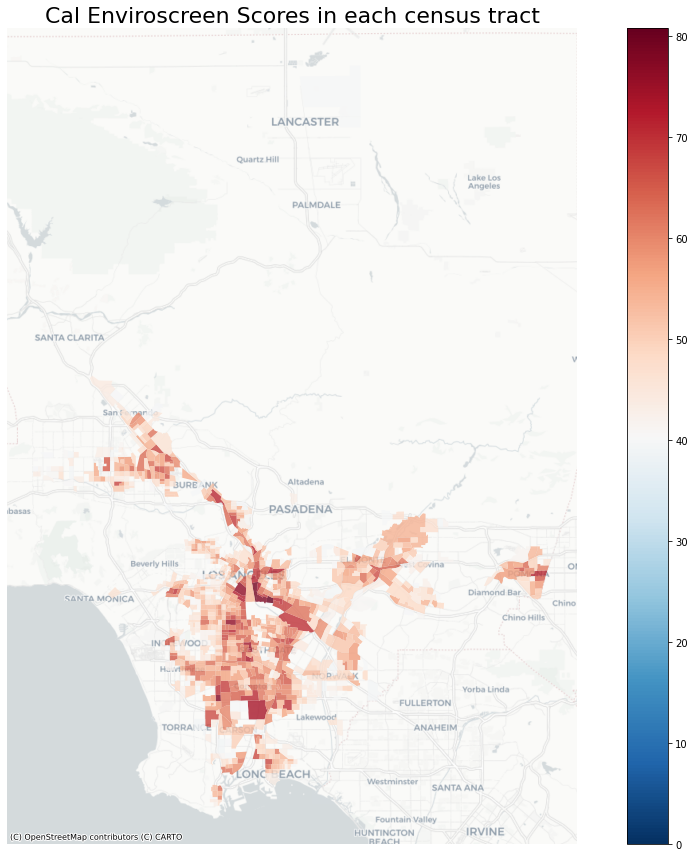

In [29]:
# Now we plot it on a map with a different color gradient
ax = combined_sorted.plot(figsize=(18,15),
                        column='Score',
                        legend=True,
                        alpha=0.8,
                        cmap='RdBu_r',    
                        vmin=0)

ax.axis('off')
ax.set_title('Cal Enviroscreen Scores in each census tract',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

#export as jpg
plt.savefig('scoretracts.jpg') #for this one it needs to show up before you plot the image, otherwise it exports an empty image

#show the map
ax.plot()

## Affordable housing map

The Affordable housing scatter plot map displays all affordable housing types funded by HCILDA and built since 2003. 

In [30]:
# there are null values in the Housing Type column, let's fill them out first
hcid['housing_type'] = hcid['housing_type'].fillna('unknown')

In [31]:
# plot the family housing
fig = px.scatter_mapbox(hcid,
                        lat="latitude",
                        lon="longitude",
                        hover_name="housing_type", 
                        color="housing_type",
                        hover_data=["housing_type", "address"], 
                        mapbox_style="carto-positron",
                        title='Affordable Housing Projects Funded by HCIDLA'
                        )
# show the map
fig.show()

In [32]:
# export the map to html
fig.write_html('map-by-type.html') 

# Creating a Function

Create a function that maps a specific census tract. First we'll work on each piece of it to make sure it works before putting together the complete function


In [33]:
# subset the Cal Enviro geodataframe for a single census tract
singledtract = combined_sorted[combined_sorted['Census Tract']=='06037204920']
singledtract 

,Census Tract,geometry,Score,Percentile Range,Burden Percentile,Characteristcs Percentile,Population,California County,Approximate Zip Code,Nearby City
221,06037204920,"MULTIPOLYGON (((-13158276.842 4030683.113, -13...",80.73,95-100% (highest scores),99.88,94.89,2598,Los Angeles,90023,Los Angeles


In [34]:
# reproject to web mercator
combined_sorted = combined_sorted.to_crs(epsg=3857)

In [35]:
# use the bounding box coordinates to set the x and y limits
minx, miny, maxx, maxy = singledtract.geometry.total_bounds

In [36]:
hcid.head()

,apn,project_number,name,development_stage,construction_type,address,council_district,site_cd,community,site_units,...,management_company,contact_phone,photo,jobs,reporturl2,contract_numbers,date_stamp,longitude,latitude,geocoded_column
0,5131020009,05-117217,LEXINGTON APARTMENTS A/B (SITE 11),In-Service,REHAB,1145 E 24TH ST CA 90011,9,11,CENTRAL,0,...,"ALPHA PROPERTY MANAGEMENT, INC.",(323) 231-4174,click here (http://hcidapp.lacity.org/mpphotos...,NaN,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.25561,34.02133,POINT (-118.25561000000002 34.02133)
1,5059004029,70033,ROSA PARKS VILLAS,In-Service,NEW CONSTRUCTION,2440 S CRENSHAW BLVD CA 90018,10,1,WELLINGTON SQUARE,60,...,TELACU PROPERTY MANAGEMENT,(323) 721-1655,click here (http://hcidapp.lacity.org/mpphotos...,153.0,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.33306,34.03429,POINT (-118.33306 34.03429)
2,5148009015,80059,NEW GENESIS,In-Service,NEW CONSTRUCTION,452 S MAIN ST CA 90013,14,1,DOWNTOWN,106,...,SRHT PROPERTY MANAGEMENT COMPANY,(213) 683-0522 x114,click here (http://hcidapp.lacity.org/mpphotos...,305.0,click here (http://hcidapp.lacity.org/ahtfRepo...,C-117296 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.24820,34.04682,POINT (-118.24820000000001 34.04682)
3,5174024020,10-117557,BOYLE HOTEL,In-Service,REHAB,101 N BOYLE AVE CA 90033,14,1,WHOLESALE DISTRICT,51,...,THE JOHN STEWART COMPANY,(213) 833-7860,click here (http://hcidapp.lacity.org/mpphotos...,160.0,click here (http://hcidapp.lacity.org/ahtfRepo...,C-118025 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.22020,34.04739,POINT (-118.2202 34.04739)
4,5545007097,11-117795,THE GORDON,In-Service,NEW CONSTRUCTION,"1553 N GORDON ST HOLLYWOOD, CA 90028",13,1,HOLLYWOOD,35,...,THE JOHN STEWART COMPANY,(213) 787-2722,click here (http://hcidapp.lacity.org/mpphotos...,76.0,click here (http://hcidapp.lacity.org/ahtfRepo...,C-120226 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.31978,34.09966,POINT (-118.31978 34.09966)


<div class="alert alert-danger">
The hcid data is in decimal degrees (4326), so when you bring it in, you need to define the crs as 'EPSG:3857'. THEN, you can convert it to web mercator (3857).
</div>

In [37]:
# convert pandas dataframe to geodataframe
hcid_geo = gpd.GeoDataFrame(hcid, 
                         crs='EPSG:4326', #Changed from 4326 
                         geometry=gpd.points_from_xy(hcid['longitude'], 
                                                     hcid['latitude']))



In [38]:
hcid_geo = hcid_geo.to_crs('EPSG:3857')

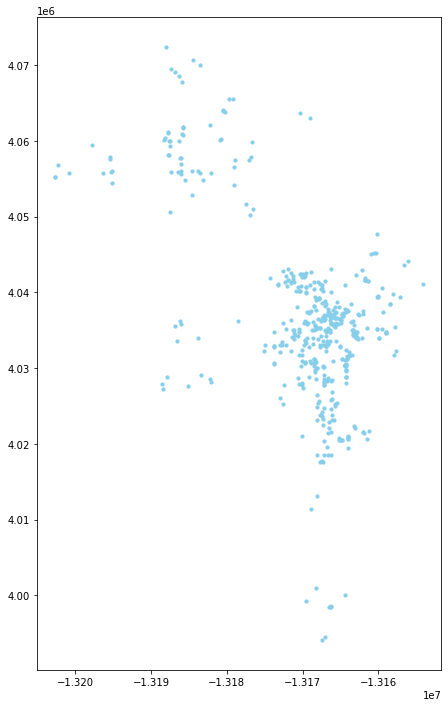

In [39]:
hcid_geo.plot(figsize=(12,12),color='skyblue',markersize=10)

[]

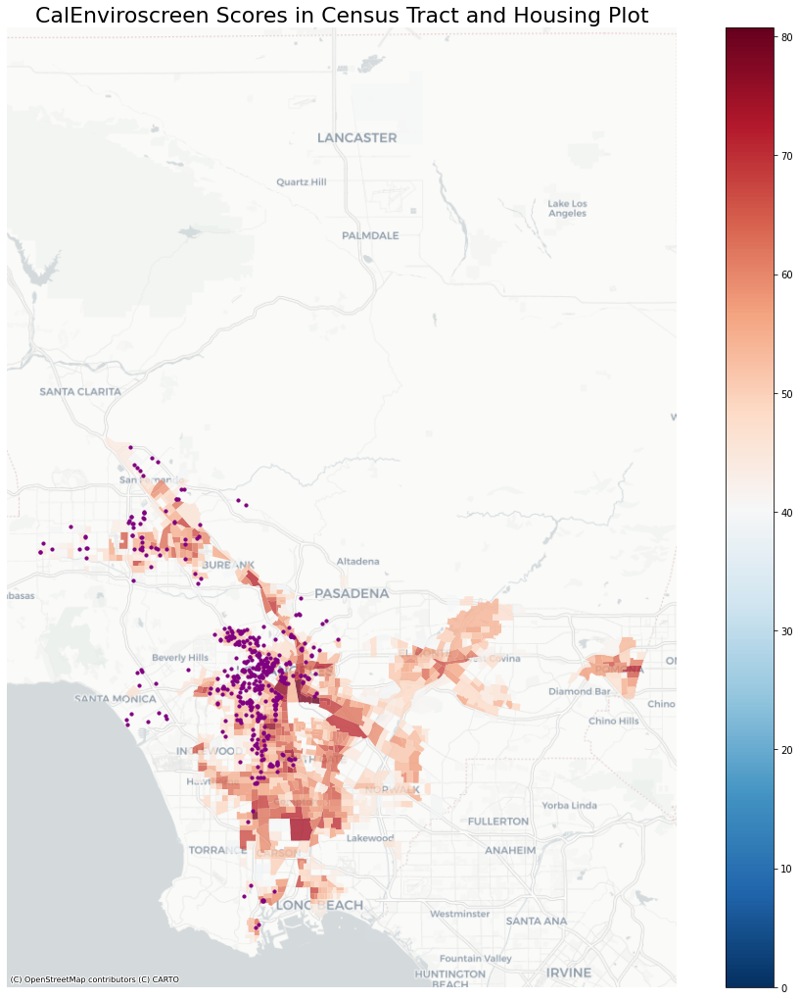

In [40]:
# 


# Now we plot it on a map with a different color gradient
base = combined_sorted.plot(figsize=(18,18),
                        column='Score',
                        legend=True,
                        alpha=0.8,
                        cmap='RdBu_r',    
                        vmin=0,
                    )
ax= hcid_geo.plot(ax=base, figsize=(18,18),color='purple', markersize=10)#creating the base map for the housing dots

ax.axis('off')
ax.set_title('CalEnviroscreen Scores in Census Tract and Housing Plot',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

#export as jpg
plt.savefig('score-with-housing.jpg') #for this one it needs to show up before you plot the image, otherwise it exports an empty image

#show the map
ax.plot()

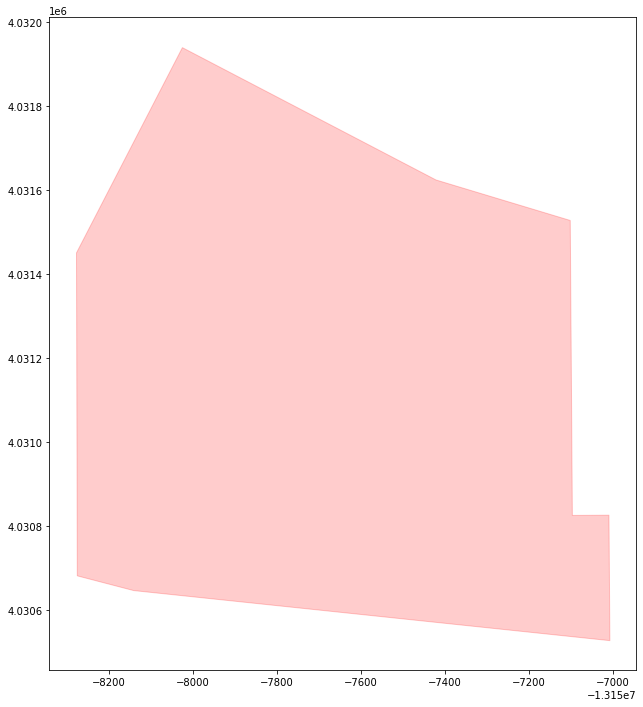

In [41]:
# define the base layer to be the neighborhood polygon
basetract = singledtract.plot(figsize=(12,12),
                             color='red', 
                             edgecolor='red',
                             alpha=0.2)

When we mapped the singled out census tract with the singled out census tract there was no data showing- We assumed that no housing was present in that census tract, but our gdp joined data frame had no rows. After projecting the

In [42]:
# do a spatial join to get affordable housing in census tract
housing_in_tract = gpd.sjoin(hcid_geo,singledtract,how='inner')

housing_in_tract

,apn,project_number,name,development_stage,construction_type,address,council_district,site_cd,community,site_units,...,index_right,Census Tract,Score,Percentile Range,Burden Percentile,Characteristcs Percentile,Population,California County,Approximate Zip Code,Nearby City
314,5191012020,12-118877,BESWICK SENIOR APARTMENTS,In-Service,NEW CONSTRUCTION,3553 E BESWICK ST CA 90023,14,1,BOYLE HEIGHTS,33,...,221,06037204920,80.73,95-100% (highest scores),99.88,94.89,2598,Los Angeles,90023,Los Angeles


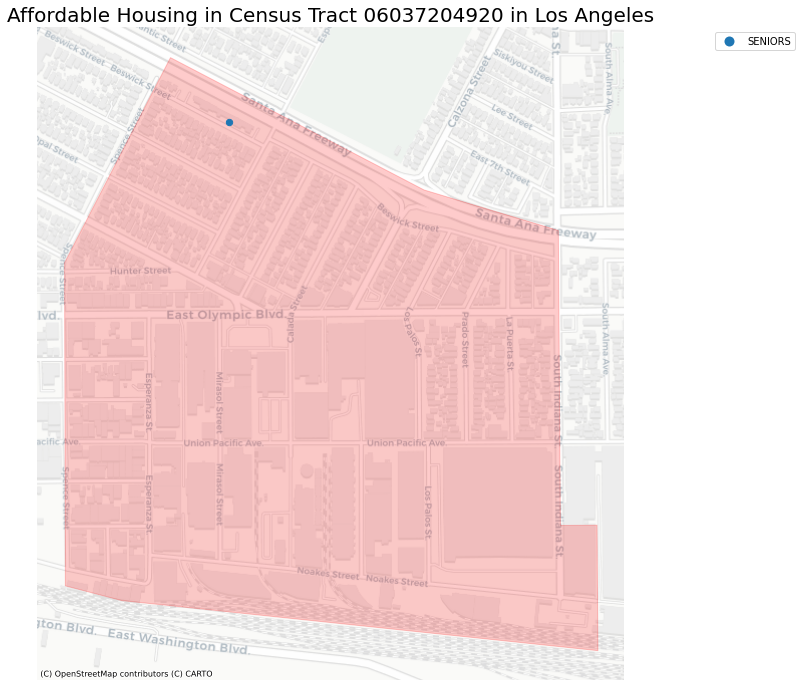

In [43]:
# define the base layer to be the neighborhood polygon
basetract = singledtract.plot(figsize=(12,12),
                             color='red', 
                             edgecolor='red',
                             alpha=0.2)

ax = housing_in_tract.plot(ax=basetract, 
    column='housing_type',
    markersize=40, 
    legend=True,
    cmap='tab20',
    legend_kwds={
       'loc': 'upper right',
       'bbox_to_anchor':(1.3,1)
    }                  # this puts the legend to the side
)

# turn off the axis
ax.axis('off')

# add a title
ax.set_title('Affordable Housing in Census Tract '+housing_in_tract['Census Tract'].values[0]+' in Los Angeles',fontsize=20)


# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax

## Combining the Housing and the Vulnerabilty score into one function

In [44]:
def map_housing_by_tract(place='06037204920'):
    
    global combined_sorted

    # reproject to web mercator
    combined_sorted = combined_sorted.to_crs(epsg=3857)
      

    # subset the Cal Enviro geodataframe for a single census tract
    singledtract = combined_sorted[combined_sorted['Census Tract']==place]
    
       
    # use the bounding box coordinates to set the x and y limits
    minx, miny, maxx, maxy = singledtract.geometry.total_bounds
    
    # convert pandas dataframe to geodataframe
    hcid_geo = gpd.GeoDataFrame(hcid, 
                         crs='EPSG:4326', #Changed from 4326 
                         geometry=gpd.points_from_xy(hcid['longitude'], 
                                                     hcid['latitude']))
    # creating a geodata frame and projecting it to EPSG:3857
    hcid_geo = hcid_geo.to_crs('EPSG:3857')
    
    # define the base layer to be the neighborhood polygon
    basetract = singledtract.plot(figsize=(5,5),
                             color='red', 
                             edgecolor='red',
                             alpha=0.2)
    # do a spatial join to get affordable housing in census tract
    housing_in_tract = gpd.sjoin(hcid_geo,singledtract,how='inner')
    
    # define the base layer to be the neighborhood polygon
    basetract = singledtract.plot(figsize=(5,5),
                             color='red', 
                             edgecolor='red',
                             alpha=0.2)

    ax = housing_in_tract.plot(ax=basetract, 
        column='housing_type',
        markersize=40, 
        legend=True,
        cmap='tab20',
        legend_kwds={
           'loc': 'upper right',
           'bbox_to_anchor':(1.3,1)
        }                  # this puts the legend to the side
    )

    # turn off the axis
    ax.axis('off')

    # add a title
    ax.set_title('Affordable Housing in Census Tract '+housing_in_tract['Census Tract'].values[0]+' in Los Angeles',fontsize=20)


    # add a basemap
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
    
    #export as jpg
    plt.savefig(place+'.jpg') #for this one it needs to show up before you plot the image, otherwise it exports an empty image

    #show the map
    ax.plot()


<div class="alert alert-danger">
There is some redundant code, so a little clean up is necessary.
    
Also, the error is because the spatial join does not return any HCID records. Add an if statement to capture this.
</div>

In [45]:
#Second function run attempt

def map_housing_by_tract(place='06037204920'):
    
    # subset the Cal Enviro geodataframe for a single census tract
    singledtract = combined_sorted[combined_sorted['Census Tract']==place]
       
    # use the bounding box coordinates to set the x and y limits
    minx, miny, maxx, maxy = singledtract.geometry.total_bounds
    
    # convert pandas dataframe to geodataframe
    hcid_geo = gpd.GeoDataFrame(hcid, 
                         crs='EPSG:4326', #Changed from 4326 
                         geometry=gpd.points_from_xy(hcid['longitude'], 
                                                     hcid['latitude']))

    # creating a geodata frame and projecting it to EPSG:3857
    hcid_geo = hcid_geo.to_crs('EPSG:3857')
    
    # do a spatial join to get affordable housing in census tract
    housing_in_tract = gpd.sjoin(hcid_geo,singledtract,how='inner')

    # only draw a map if it returns more than one record
    if len(housing_in_tract)> 0:
        # define the base layer to be the neighborhood polygon
        basetract = singledtract.plot(figsize=(10,10),
                                 color='red', 
                                 edgecolor='red',
                                 alpha=0.2)

        ax = housing_in_tract.plot(ax=basetract, 
            column='housing_type',
            markersize=40, 
            legend=True,
            cmap='tab20',
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1.3,1)
            }                  # this puts the legend to the side
        )

        # turn off the axis
        ax.axis('off')

        # add a title
        ax.set_title('Affordable Housing in Census Tract '+housing_in_tract['Census Tract'].values[0]+' in Los Angeles',fontsize=20)


        # add a basemap
        ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
        
        #export as jpg, specify the tight setting because it was cutting off the image.
        plt.savefig(place+'.jpg',bbox_inches='tight') #for this one it needs to show up before you plot the image, otherwise it exports an empty image

        #show the map
        ax.plot()

        
    
    # no records found
    else:
        print('No records found.')
        


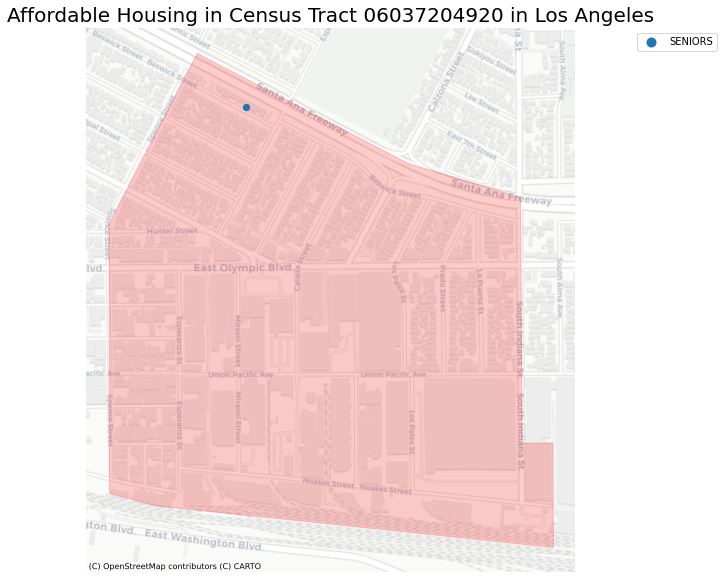

In [46]:
# call the function!
map_housing_by_tract(place='06037204920')

In [47]:
# call the function!
map_housing_by_tract(place='06037291220')

No records found.


## Trying our function with the census tracts with the highest CalEnviro Score

We run this function for all of the top 10 census tracts, and only one of them showed a housing project withing its boundary. This leads to our preliminary conclusion that not sufficient affordable housing is being built in the top most vulnerable census tracts.

In [48]:
# Highest score census tract at 99.04
map_housing_by_tract(place='06019001100')

No records found.


In [49]:
# Highest score census tract at 94.90
map_housing_by_tract(place='06071001600')

No records found.


In [50]:
# Highest score census tract at 85.97
map_housing_by_tract(place='06019000200')

No records found.


In [51]:
# Highest score census tract at 85.97
map_housing_by_tract(place='06077000801')

No records found.


In [52]:
# Highest score census tract at 82.03
map_housing_by_tract(place='06019001500')

No records found.


In [53]:
# Highest score census tract at 80.18
map_housing_by_tract(place='06077000300')

No records found.


In [54]:
# Highest score census tract at 80.13
map_housing_by_tract(place='06019001000')

No records found.


In [55]:
# Highest score census tract at 79.03
map_housing_by_tract(place='06037206050')

No records found.


In [56]:
# Highest score census tract at 78.53
map_housing_by_tract(place='06019000400')

No records found.


## Testing this function with a random census tract
We run one other random census tract and it shows one senior project and one family project. With this random run test, we know that the function is working, but only with the census tracts that do have at least one affordable housing project. 

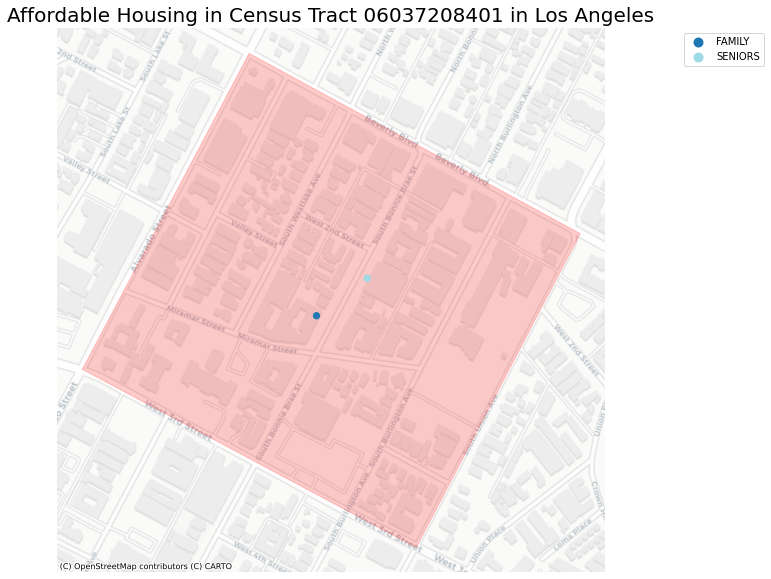

In [57]:
# random census tract in the Westlake area
map_housing_by_tract(place='06037208401')



# Creating an interactive multi-layered folium map

## Creating Clusters
It's a little bit tedious to look at each census tract individually, so let's create an interactive map that clusters the housing projects on top of the CalEnviro Map.

In [58]:
# project back to WGS84
hcid_geo=hcid_geo.to_crs('EPSG:4326')

In [59]:
minx, miny, maxx, maxy = hcid_geo.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-118.60178999999998
-118.16525
33.74110000000001
34.32402000000002


In [60]:
center_lon = (maxx-minx)/2+minx
center_lon

-118.38351999999999

In [61]:
center_lat = (maxy-miny)/2+miny
center_lat

34.03256000000002

In [62]:
hcid_geo['housing_type'].value_counts()

FAMILY                            237
SPECIAL NEEDS                     126
SENIORS                            88
LARGE FAMILY / WAIVER REQUIRED     23
unknown                            12
AT-RISK                             2
SRO                                 1
Name: housing_type, dtype: int64

In [63]:
# create a function that gives an icon color by housing type (change the colors to your liking)
def color_by_type(type):
    if type == 'FAMILY':
        return 'red'
    if type == 'SPECIAL NEEDS':
        return 'blue'
    if type == 'SENIORS':
        return 'green'
    if type == 'LARGE FAMILY / WAIVER REQUIRED':
        return 'orange'
    if type == 'unknown':
        return 'gray'
    if type == 'AT-RISK':
        return 'white'
    if type == 'SRO':
        return 'pink'
    

In [64]:
# create the new column, and assign it a color based on housing type
hcid_geo['marker_color'] = hcid_geo.apply(lambda row: color_by_type(row['housing_type']), axis=1)

In [65]:
hcid_geo[['housing_type','marker_color']].sample(10)

,housing_type,marker_color
237,FAMILY,red
361,SPECIAL NEEDS,blue
190,SPECIAL NEEDS,blue
220,FAMILY,red
340,FAMILY,red
358,SPECIAL NEEDS,blue
221,LARGE FAMILY / WAIVER REQUIRED,orange
288,FAMILY,red
179,FAMILY,red
95,FAMILY,red


In [66]:
m = folium.Map(location=[34,-118.2],tiles='cartodbpositron',)

# create an empty marker cluster layer
marker_cluster = MarkerCluster(name='Affordable Housing in LA County by Type').add_to(m)

# loop through the arrest data and add each row as a marker to the marker cluster
for index, row in hcid_geo.iterrows():

    folium.Marker(
        location=[row['latitude'],row['longitude']],
        popup=row['address'],
        tooltip=row['housing_type'],
        icon=folium.Icon(color=row.marker_color,icon='home')
    ).add_to(marker_cluster)

m

In [67]:
m.save('housing-cluster.html')

## Lets add more info to the popup

We have the report url in the data set but it includes some extra characers before and after the url, so we need to get rid of it. We'll iterate through the dataset and create a column with the naked url for the report and the photo.

In [68]:
# Create a list to store the report URL data
report_link = []

for index, row in hcid_geo.iterrows():
    string =row['reporturl2']
    report_clean=string[12:-1]
    print(report_clean)
    report_link.append(report_clean)

http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=05-117217&LutSiteCD=11
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=070033&LutSiteCD=1
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=080059&LutSiteCD=1
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=10-117557&LutSiteCD=1
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=11-117795&LutSiteCD=1
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=11-118659&LutSiteCD=1
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=14-121135&LutSiteCD=1
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=14-121272&LutSiteCD=1
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=15-122419&LutSiteCD=1
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_Number=15-122886&LutSiteCD=1
http://hcidapp.lacity.org/ahtfReportViewer/mpreport.aspx?Project_

In [69]:
# Create a column from the list
hcid_geo['report_url_clean'] = report_link

hcid_geo.head()

,apn,project_number,name,development_stage,construction_type,address,council_district,site_cd,community,site_units,...,jobs,reporturl2,contract_numbers,date_stamp,longitude,latitude,geocoded_column,geometry,marker_color,report_url_clean
0,5131020009,05-117217,LEXINGTON APARTMENTS A/B (SITE 11),In-Service,REHAB,1145 E 24TH ST CA 90011,9,11,CENTRAL,0,...,NaN,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.25561,34.02133,POINT (-118.25561000000002 34.02133),POINT (-118.25561 34.02133),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...
1,5059004029,70033,ROSA PARKS VILLAS,In-Service,NEW CONSTRUCTION,2440 S CRENSHAW BLVD CA 90018,10,1,WELLINGTON SQUARE,60,...,153.0,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.33306,34.03429,POINT (-118.33306 34.03429),POINT (-118.33306 34.03429),green,http://hcidapp.lacity.org/ahtfReportViewer/mpr...
2,5148009015,80059,NEW GENESIS,In-Service,NEW CONSTRUCTION,452 S MAIN ST CA 90013,14,1,DOWNTOWN,106,...,305.0,click here (http://hcidapp.lacity.org/ahtfRepo...,C-117296 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.24820,34.04682,POINT (-118.24820000000001 34.04682),POINT (-118.24820 34.04682),blue,http://hcidapp.lacity.org/ahtfReportViewer/mpr...
3,5174024020,10-117557,BOYLE HOTEL,In-Service,REHAB,101 N BOYLE AVE CA 90033,14,1,WHOLESALE DISTRICT,51,...,160.0,click here (http://hcidapp.lacity.org/ahtfRepo...,C-118025 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.22020,34.04739,POINT (-118.2202 34.04739),POINT (-118.22020 34.04739),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...
4,5545007097,11-117795,THE GORDON,In-Service,NEW CONSTRUCTION,"1553 N GORDON ST HOLLYWOOD, CA 90028",13,1,HOLLYWOOD,35,...,76.0,click here (http://hcidapp.lacity.org/ahtfRepo...,C-120226 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.31978,34.09966,POINT (-118.31978 34.09966),POINT (-118.31978 34.09966),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...


In [70]:
# Create a list to store the photo URL data
photo_link = []

for index, row in hcid_geo.iterrows():
    string =row['photo']
    photo_clean=string[12:-1]
    print(photo_clean)
    photo_link.append(photo_clean)

http://hcidapp.lacity.org/mpphotos/ImageNotAvailable.png
http://hcidapp.lacity.org/mpphotos/070033/Photo/Website/CD%2010%20-%20Rosa%20Parks%20Villas%20-%20070033.png
http://hcidapp.lacity.org/mpphotos/080059/Photo/Website/080059.JPG
http://hcidapp.lacity.org/mpphotos/10-117557/Photo/Website/10-117557.JPG
http://hcidapp.lacity.org/mpphotos/11-117795/Photo/Website/11-117795.jpg
http://hcidapp.lacity.org/mpphotos/11-118659/Photo/Website/Fickett.png
http://hcidapp.lacity.org/mpphotos/ImageNotAvailable.png
http://hcidapp.lacity.org/mpphotos/ImageNotAvailable.png
http://hcidapp.lacity.org/mpphotos/ImageNotAvailable.png
http://hcidapp.lacity.org/mpphotos/ImageNotAvailable.png
http://hcidapp.lacity.org/mpphotos/ImageNotAvailable.png
http://hcidapp.lacity.org/mpphotos/ImageNotAvailable.png
http://hcidapp.lacity.org/mpphotos/ImageNotAvailable.png
http://hcidapp.lacity.org/mpphotos/14-121651/Photo/Website/The%20Campus.png
http://hcidapp.lacity.org/mpphotos/060013/Photo/Website/CD%208%20-%20Morgan

In [71]:
# Create a column from the list
hcid_geo['photo_url_clean'] = photo_link

hcid_geo.head()

,apn,project_number,name,development_stage,construction_type,address,council_district,site_cd,community,site_units,...,reporturl2,contract_numbers,date_stamp,longitude,latitude,geocoded_column,geometry,marker_color,report_url_clean,photo_url_clean
0,5131020009,05-117217,LEXINGTON APARTMENTS A/B (SITE 11),In-Service,REHAB,1145 E 24TH ST CA 90011,9,11,CENTRAL,0,...,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.25561,34.02133,POINT (-118.25561000000002 34.02133),POINT (-118.25561 34.02133),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/ImageNotAva...
1,5059004029,70033,ROSA PARKS VILLAS,In-Service,NEW CONSTRUCTION,2440 S CRENSHAW BLVD CA 90018,10,1,WELLINGTON SQUARE,60,...,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.33306,34.03429,POINT (-118.33306 34.03429),POINT (-118.33306 34.03429),green,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/070033/Phot...
2,5148009015,80059,NEW GENESIS,In-Service,NEW CONSTRUCTION,452 S MAIN ST CA 90013,14,1,DOWNTOWN,106,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-117296 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.24820,34.04682,POINT (-118.24820000000001 34.04682),POINT (-118.24820 34.04682),blue,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/080059/Phot...
3,5174024020,10-117557,BOYLE HOTEL,In-Service,REHAB,101 N BOYLE AVE CA 90033,14,1,WHOLESALE DISTRICT,51,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-118025 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.22020,34.04739,POINT (-118.2202 34.04739),POINT (-118.22020 34.04739),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/10-117557/P...
4,5545007097,11-117795,THE GORDON,In-Service,NEW CONSTRUCTION,"1553 N GORDON ST HOLLYWOOD, CA 90028",13,1,HOLLYWOOD,35,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-120226 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.31978,34.09966,POINT (-118.31978 34.09966),POINT (-118.31978 34.09966),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/11-117795/P...


In [72]:
m = folium.Map(location=[34,-118.2],tiles='cartodbpositron',)

# create an empty marker cluster layer
marker_cluster = MarkerCluster(name='Affordable Housing in LA County by Type').add_to(m)

# loop through the arrest data and add each row as a marker to the marker cluster
for index, row in hcid_geo.iterrows():
    
    #create a variable for the info for each element to display in the popup. Change the text to title case since the data is in all caps
    project_name=row['name'].title()
    project_address=row['address'].title()
    more_info=row['report_url_clean']
    thumbnail=row['photo_url_clean']
    
    #create string together the info inside the html tags
    popup_content='<h4>'+project_name+'</h4><img src="'+thumbnail+'"width="100%"><p>'+project_address+'</p><a href="'+more_info+'"target="_blank">More Info >></a>'

    folium.Marker(
        location=[row['latitude'],row['longitude']], 
        popup = folium.Popup(popup_content, max_width=250,min_width=250),
        tooltip=row['housing_type'],
        icon=folium.Icon(color=row.marker_color,icon='home')
    ).add_to(marker_cluster)

m

## Adding Second Layer of our cluster map

Now we add the chloropleth map of the CalEnviro Scores under our clusters

In [73]:
# Creating a new dataframe to rename our columns 
cluster2 = combined_sorted[["Census Tract",'geometry','Score']]

In [74]:
cluster2.columns = ['CensusTract','geometry','Score']
cluster2.head()

,CensusTract,geometry,Score
221,06037204920,"MULTIPOLYGON (((-13158276.842 4030683.113, -13...",80.73
227,06037206050,"MULTIPOLYGON (((-13160499.892 4030849.912, -13...",79.03
223,06037205120,"MULTIPOLYGON (((-13160182.632 4030829.767, -13...",78.04
458,06037291220,"MULTIPOLYGON (((-13168082.976 4011744.589, -13...",77.50
409,06037239202,"MULTIPOLYGON (((-13166193.439 4026564.006, -13...",76.04


In [75]:
# choropleth map of CalEnviro Score
folium.Choropleth(
    cluster2, # the geodataframe
    data=cluster2, # the data is in the geodataframe, so same value
    key_on= 'feature.properties.CensusTract',# the id column
    columns=['CensusTract', 'Score'], # the id column, followed by the variable to map
    fill_color='RdPu', # color scheme
    fill_opacity=0.4, 
    line_opacity=0.1, 
    legend_name="CalEnviro Score",
    name="CalEnviro Base map", # name the layer
    ).add_to(m)

# add a nice layer control
folium.LayerControl().add_to(m)

# output the map
m


In [76]:
m.save('housing-enviro.html')

In [77]:
cal = folium.Map(location=[34,-118.2],tiles='cartodbpositron',)

In [78]:
# choropleth map of CalEnviro Score
folium.Choropleth(
    cluster2, # the geodataframe
    data=cluster2, # the data is in the geodataframe, so same value
    key_on= 'feature.properties.CensusTract',# the id column
    columns=['CensusTract', 'Score'], # the id column, followed by the variable to map
    fill_color='RdPu', # color scheme
    fill_opacity=0.4, 
    line_opacity=0.1, 
    legend_name="CalEnviro Score",
    name="CalEnviro Base map", # name the layer
    vmin=0
).add_to(cal)

# output the map
cal


In [79]:
cal.save('enviro-only.html')

# Getting Set up for Statistics

## Put the two maps together
First, we create a full size static map showing the location of the affordable housing projects overlaid on the CalEnviro Screen scores map.

In [80]:
# project back to webmercator because otherwise it breaks..
hcid_geo=hcid_geo.to_crs('EPSG:3857')

In [81]:
# get the bounding box coordinates for housing data
minx, miny, maxx, maxy = hcid_geo.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)


-13202690.869970763
-13154095.45945987
3994090.834414092
4072393.420646349


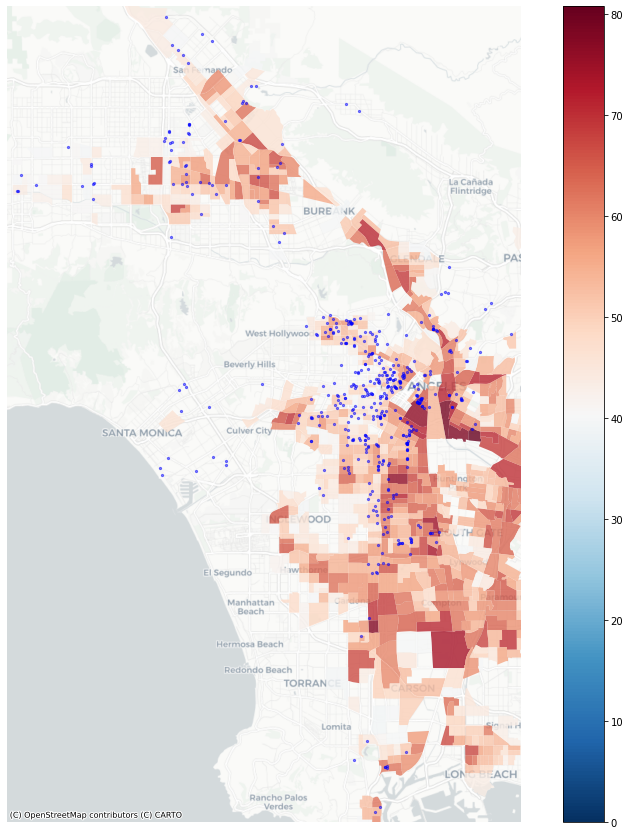

In [82]:
# set up the plot canvas with plt.subplots - DEFINE THE PLOT FIRST  in terms of size, and once it defines the axis, we can tell the map to go into that axis. 
fig, ax = plt.subplots(figsize=(15, 15))

# block groups - instead of two graphics, we put it on top of each other. 
combined_sorted.plot(ax=ax, # this puts it in the ax plot
         column='Score',
                        legend=True,
                        alpha=0.8,
                        cmap='RdBu_r',    
                        vmin=0) 
# arrests
hcid_geo.plot(ax=ax, # this also puts it in the same ax plot
            color='blue',
            markersize=5,
            alpha=0.5)

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [83]:
hcid_geo.head()

,apn,project_number,name,development_stage,construction_type,address,council_district,site_cd,community,site_units,...,reporturl2,contract_numbers,date_stamp,longitude,latitude,geocoded_column,geometry,marker_color,report_url_clean,photo_url_clean
0,5131020009,05-117217,LEXINGTON APARTMENTS A/B (SITE 11),In-Service,REHAB,1145 E 24TH ST CA 90011,9,11,CENTRAL,0,...,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.25561,34.02133,POINT (-118.25561000000002 34.02133),POINT (-13164154.289 4031666.484),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/ImageNotAva...
1,5059004029,70033,ROSA PARKS VILLAS,In-Service,NEW CONSTRUCTION,2440 S CRENSHAW BLVD CA 90018,10,1,WELLINGTON SQUARE,60,...,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.33306,34.03429,POINT (-118.33306 34.03429),POINT (-13172775.983 4033407.265),green,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/070033/Phot...
2,5148009015,80059,NEW GENESIS,In-Service,NEW CONSTRUCTION,452 S MAIN ST CA 90013,14,1,DOWNTOWN,106,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-117296 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.24820,34.04682,POINT (-118.24820000000001 34.04682),POINT (-13163329.411 4035090.542),blue,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/080059/Phot...
3,5174024020,10-117557,BOYLE HOTEL,In-Service,REHAB,101 N BOYLE AVE CA 90033,14,1,WHOLESALE DISTRICT,51,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-118025 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.22020,34.04739,POINT (-118.2202 34.04739),POINT (-13160212.465 4035167.122),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/10-117557/P...
4,5545007097,11-117795,THE GORDON,In-Service,NEW CONSTRUCTION,"1553 N GORDON ST HOLLYWOOD, CA 90028",13,1,HOLLYWOOD,35,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-120226 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.31978,34.09966,POINT (-118.31978 34.09966),POINT (-13171297.660 4042191.792),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/11-117795/P...


## Spatial Join

In [84]:
# Do the spatial join ' this requires 3 data frames, the df you want data from, to. gfd is census groups. so we can summarize the arrests by cencus groups.'
join = gpd.sjoin(combined_sorted, hcid_geo,how='right')
join.head()

,index_left,Census Tract,Score,Percentile Range,Burden Percentile,Characteristcs Percentile,Population,California County,Approximate Zip Code,Nearby City,...,reporturl2,contract_numbers,date_stamp,longitude,latitude,geocoded_column,geometry,marker_color,report_url_clean,photo_url_clean
314,221.0,06037204920,80.73,95-100% (highest scores),99.88,94.89,2598.0,Los Angeles,90023.0,Los Angeles,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-121979 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.19931,34.02223,POINT (-118.19931 34.02223),POINT (-13157887.001 4031787.363),green,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/12-118877/P...
427,409.0,06037239202,76.04,95-100% (highest scores),96.91,99.23,4724.0,Los Angeles,90001.0,Los Angeles,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-108434 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.27346,33.98525,POINT (-118.27346000000001 33.98525),POINT (-13166141.342 4026821.633),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/030157/Phot...
237,778.0,06037535400,74.46,95-100% (highest scores),97.41,97.96,3495.0,Los Angeles,90002.0,Los Angeles,...,click here (http://hcidapp.lacity.org/ahtfRepo...,NaN,2020-11-25T00:00:00.000,-118.22890,33.94670,POINT (-118.2289 33.9467),POINT (-13161180.945 4021647.382),red,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/ImageNotAva...
320,216.0,06037204600,73.13,95-100% (highest scores),98.53,94.83,4101.0,Los Angeles,90023.0,Los Angeles,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-123417 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.21750,34.03863,POINT (-118.21750000000002 34.03863),POINT (-13159911.903 4033990.272),green,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/10-118599/P...
84,216.0,06037204600,73.13,95-100% (highest scores),98.53,94.83,4101.0,Los Angeles,90023.0,Los Angeles,...,click here (http://hcidapp.lacity.org/ahtfRepo...,C-122710 (https://hcidapp.lacity.org/citycontr...,2020-11-25T00:00:00.000,-118.21750,34.03863,POINT (-118.21750000000002 34.03863),POINT (-13159911.903 4033990.272),green,http://hcidapp.lacity.org/ahtfReportViewer/mpr...,http://hcidapp.lacity.org/mpphotos/13-119072/P...


Earlier, we joined housing projects to individual census tracts that we manually selected. Now we are counting up all of the affordable housing projects in each tract

In [85]:
housing_by_all_tracts = join['Census Tract'].value_counts().rename_axis('Census Tract').reset_index(name='housing_count')

In [86]:
housing_by_all_tracts.head()

,Census Tract,housing_count
0,06037206300,16
1,06037209102,8
2,06037228310,7
3,06037224420,7
4,06037231220,7


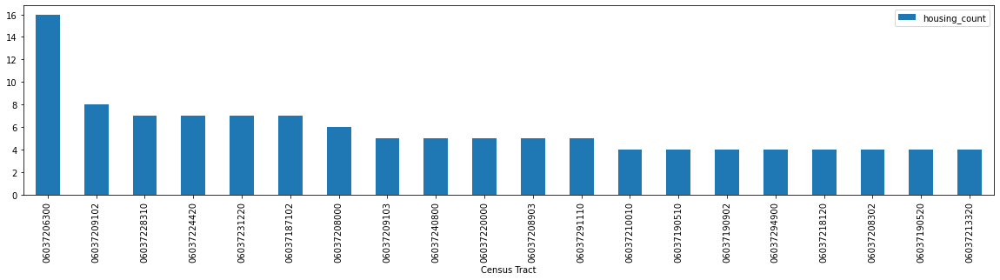

In [87]:
housing_by_all_tracts[:20].plot.bar(figsize=(20,4),
                             x='Census Tract',
                             y='housing_count')

In [88]:
 
final_merge= housing_by_all_tracts.merge(tracts_trimmed,on="Census Tract")

# show me the first 5 to make sure it worked
final_merge.tail()

,Census Tract,housing_count,geometry
204,06037243000,1,"MULTIPOLYGON (((-118.23902 33.93789, -118.2390..."
205,06037121802,1,"MULTIPOLYGON (((-118.39652 34.21711, -118.3965..."
206,06037211202,1,"MULTIPOLYGON (((-118.29656 34.07631, -118.2916..."
207,06037208402,1,"MULTIPOLYGON (((-118.27030 34.06668, -118.2669..."
208,06037241202,1,"MULTIPOLYGON (((-118.29153 33.92877, -118.2916..."


In [89]:
# Joining housing and all census tracts

left_merged = pd.merge(tracts_trimmed, housing_by_all_tracts,
                        how="left", on=["Census Tract"])
left_merged.head()
left_merged.tail(20)


,Census Tract,geometry,housing_count
2326,06037980010,"MULTIPOLYGON (((-118.25012 34.07367, -118.2496...",NaN
2327,06037980013,"MULTIPOLYGON (((-118.39617 33.90333, -118.3958...",NaN
2328,06037980014,"MULTIPOLYGON (((-118.26070 33.76618, -118.2608...",NaN
2329,06037980015,"MULTIPOLYGON (((-118.31048 33.76685, -118.3087...",1.0
2330,06037980018,"MULTIPOLYGON (((-118.18064 33.80432, -118.1806...",NaN
2331,06037980019,"MULTIPOLYGON (((-118.59920 34.07434, -118.5647...",NaN
2332,06037980020,"MULTIPOLYGON (((-118.34419 34.21410, -118.3441...",NaN
2333,06037980021,"MULTIPOLYGON (((-118.40191 34.26466, -118.4016...",NaN
2334,06037980022,"MULTIPOLYGON (((-118.50255 34.30733, -118.5026...",NaN
2335,06037980023,"MULTIPOLYGON (((-118.64678 34.22221, -118.6467...",NaN


In [90]:
# replacing na values in college with No college 
left_merged["housing_count"].fillna(0, inplace = True) 
  
left_merged.tail(10)

,Census Tract,geometry,housing_count
2336,06037980024,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",0.0
2337,06037980025,"MULTIPOLYGON (((-118.25710 33.83655, -118.2571...",0.0
2338,06037980026,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517...",0.0
2339,06037980028,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464...",0.0
2340,06037980030,"MULTIPOLYGON (((-118.43712 33.91639, -118.4299...",0.0
2341,06037980031,"MULTIPOLYGON (((-118.28530 33.70860, -118.2833...",0.0
2342,06037980033,"MULTIPOLYGON (((-118.24463 33.71077, -118.2318...",0.0
2343,06037990100,"MULTIPOLYGON (((-118.95114 33.99643, -118.9505...",0.0
2344,06037990200,"MULTIPOLYGON (((-118.63168 34.00001, -118.6359...",0.0
2345,06037990300,"MULTIPOLYGON (((-118.48228 33.74869, -118.4765...",0.0


## Rejoin to main geo data frame

Now that we have the total number of projects in each census tract we add this number back to the main data frame using Census Tract as the common column. 

In [91]:
left_merged = left_merged.to_crs(epsg=3857)

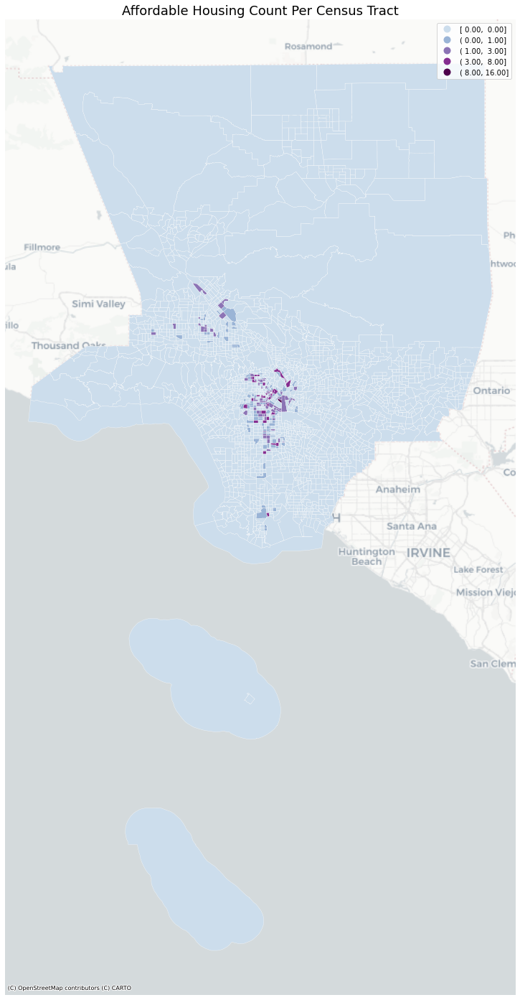

In [92]:
ax = left_merged.plot(figsize=(30,25),
                        column='housing_count',
                        legend=True,
                        alpha=1,
                        cmap='BuPu',
                        scheme='natural_breaks',
                        edgecolor='white', 
                        linewidth=0.3,
                        vmin=-1)

ax.axis('off')
ax.set_title('Affordable Housing Count Per Census Tract',fontsize=18)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.savefig('housing_count2.jpg')

# Spatial Statistics

## Spatial Auto Correlation

Now we attempt to do a spatial auto correlation. It seems to work for the most part but we get a user warning below saying there are 2 disconnected components. We're not sure what that means but it doesn't seem to prevent us from continuing forward so we'll keep going.

In [93]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(left_merged,k=8)
wq.transform = 'r'

In [94]:
# create a new column for the spatial lag
left_merged['housing_count_lag'] = lps.weights.lag_spatial(wq,left_merged['housing_count'])


In [95]:
left_merged.sort_values(by='housing_count',ascending=False).sample(50)


,Census Tract,geometry,housing_count,housing_count_lag
750,06037234502,"MULTIPOLYGON (((-13172600.655 4029002.367, -13...",0.0,0.375
136,06037119400,"MULTIPOLYGON (((-13185070.553 4061061.884, -13...",0.0,0.000
1203,06037406701,"MULTIPOLYGON (((-13130490.495 4036161.091, -13...",0.0,0.000
1670,06037541100,"MULTIPOLYGON (((-13165422.886 4014481.660, -13...",0.0,0.000
1365,06037462201,"MULTIPOLYGON (((-13151447.614 4049239.501, -13...",0.0,0.000
2140,06037702502,"MULTIPOLYGON (((-13179798.573 4029762.674, -13...",0.0,0.000
1806,06037554801,"MULTIPOLYGON (((-13145830.210 4011875.983, -13...",0.0,0.000
490,06037199400,"MULTIPOLYGON (((-13159588.186 4039546.449, -13...",0.0,0.625
1272,06037430301,"MULTIPOLYGON (((-13138138.033 4049853.856, -13...",0.0,0.000
1442,06037482304,"MULTIPOLYGON (((-13147644.384 4037224.752, -13...",0.0,0.000


## Spatial Lag Map

And finally now we map the spatial lag. It looks like downtown has quite a high lag compared to the rest of the city which seems in line with what we could guess by looking at the original map. We added the actual locations of the housing projects to the map as well to see how they lined up.


In [96]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe (left_merged,k=8)
wq.transform = 'r'

In [97]:
# create a new column for the spatial lag
left_merged['housing_count_lag'] = lps.weights.lag_spatial(wq,left_merged['housing_count'])
left_merged.head(5)

,Census Tract,geometry,housing_count,housing_count_lag
0,06037101110,"MULTIPOLYGON (((-13169350.794 4063591.834, -13...",0.0,0.0
1,06037101122,"MULTIPOLYGON (((-13169466.900 4065590.632, -13...",0.0,0.0
2,06037101210,"MULTIPOLYGON (((-13169034.646 4063225.625, -13...",0.0,0.0
3,06037101220,"MULTIPOLYGON (((-13167528.828 4062280.326, -13...",0.0,0.0
4,06037101300,"MULTIPOLYGON (((-13166031.469 4060067.620, -13...",0.0,0.0


In [98]:
left_merged.sort_values(by='housing_count',ascending=False).sample(10)

,Census Tract,geometry,housing_count,housing_count_lag
2259,06037920016,"MULTIPOLYGON (((-13195185.153 4090750.671, -13...",0.0,0.000
1828,06037570403,"MULTIPOLYGON (((-13158917.375 4012010.731, -13...",0.0,0.000
515,06037203900,"MULTIPOLYGON (((-13157851.602 4032947.195, -13...",0.0,0.125
199,06037124400,"MULTIPOLYGON (((-13181692.452 4051431.530, -13...",0.0,0.000
2240,06037910712,"MULTIPOLYGON (((-13142210.991 4101974.476, -13...",0.0,0.000
1279,06037430721,"MULTIPOLYGON (((-13141768.050 4046521.106, -13...",0.0,0.000
1253,06037408626,"MULTIPOLYGON (((-13128167.703 4026381.831, -13...",0.0,0.000
160,06037121802,"MULTIPOLYGON (((-13179840.207 4057992.657, -13...",1.0,0.250
1451,06037482702,"MULTIPOLYGON (((-13151519.749 4033977.375, -13...",0.0,0.000
1752,06037552100,"MULTIPOLYGON (((-13146825.517 4015671.656, -13...",0.0,0.000


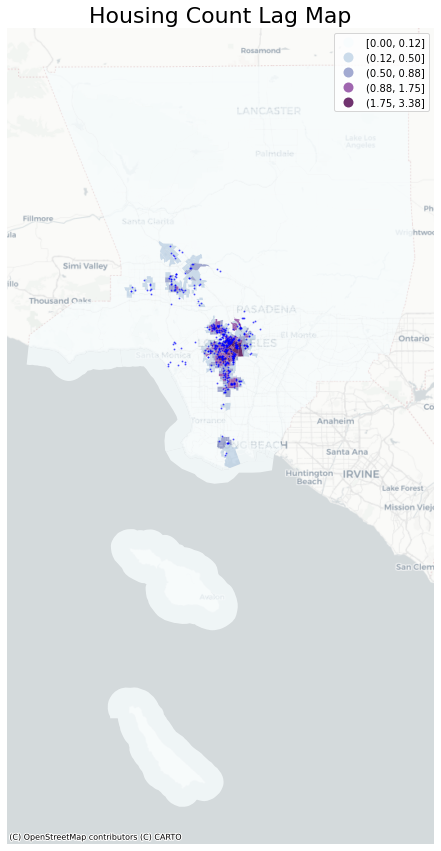

In [99]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
left_merged.plot(ax=ax,
         figsize=(15,15),
         column='housing_count_lag',
         legend=True,
         alpha=0.8,
         cmap='BuPu',
         scheme='natural_breaks')

# add actual point locations of housing
hcid_geo.plot(ax=ax, 
              color='blue',
              markersize =1,
              alpha=0.5, 
              legend=True)

ax.axis('off')
ax.set_title('Housing Count Lag Map',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

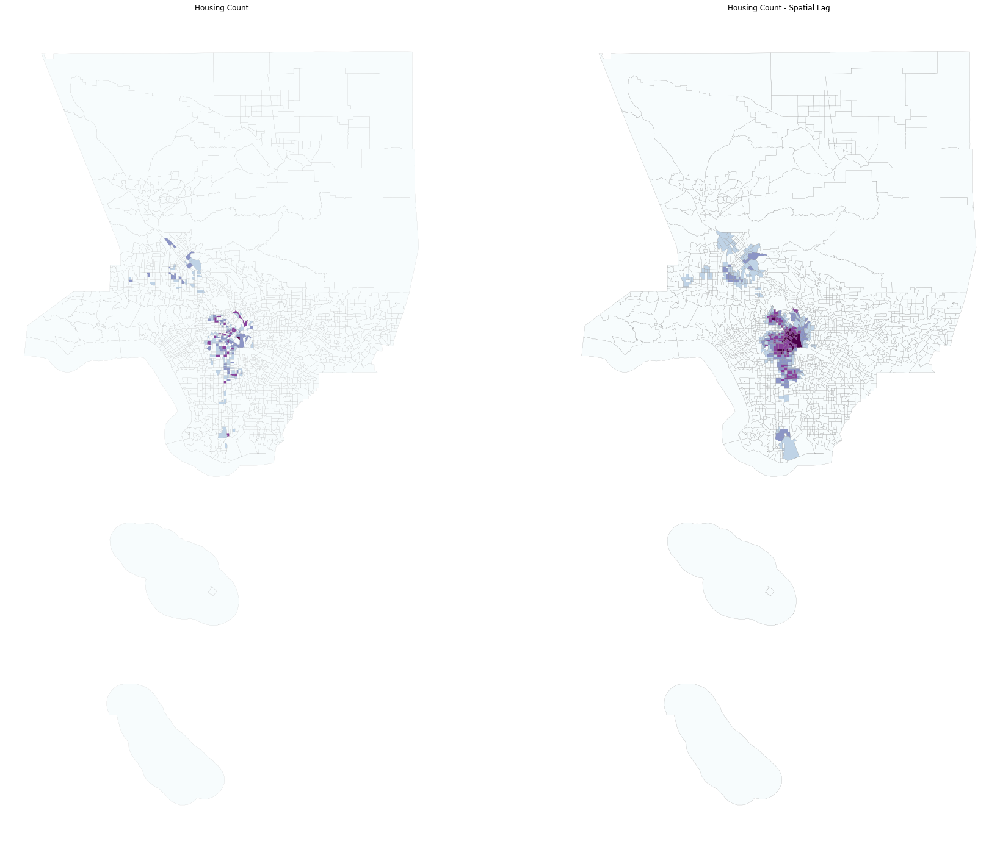

In [100]:
# create the 1x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(30, 25))

# name each subplot
ax1, ax2 = axs

# regular count map on the left
left_merged.plot(column='housing_count', 
            cmap='BuPu', 
            scheme='natural_breaks',
            k=5, 
            edgecolor='grey', 
            linewidth=0.1, 
            alpha=1, 
            ax=ax1 # this assigns the map to the subplot
           )


ax1.axis("off")
ax1.set_title("Housing Count")

# spatial lag map on the right
left_merged.plot(column='housing_count_lag', 
            cmap='BuPu', 
            scheme='natural_breaks',
            k=5, 
            edgecolor='grey', 
            linewidth=0.2, 
            alpha=1, 
            ax=ax2 # this assigns the map to the subplot
           )

ax2.axis("off")
ax2.set_title("Housing Count - Spatial Lag")
plt.savefig('housingvslag.jpg')
plt.show()


Here we showed them side by side, but again with this k class error, it's not clear if this is a totally accurate visualization of the clustering. But it looks like there is a strong clustering downtown.

## Interactive spatial lag

In this section we joined the combined_sorted and the housing_count data frame lag with the javascript interactive base map using the choropleth_mapbox.

The map shows the census tracts with the highest concentration of housing projects that have also a enviro screen score. 

We added a couple of labels to the hover data option including: the number of units, the Cal Enviro Score of that census tract and the lag index score. We observed that some of the census tracts that have the highest housing number and lag score do not necessarily have a high CalEnviro Score, meaning the housing is not located in the most vulnerable areas. 

In [101]:
# interactive version needs to be in WGS84
gdf_web = left_merged.to_crs('EPSG:4326')

In [102]:
gdf_web.head(10)

,Census Tract,geometry,housing_count,housing_count_lag
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...",0.0,0.00
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031...",0.0,0.00
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859...",0.0,0.00
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859...",0.0,0.00
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719...",0.0,0.00
5,06037101400,"MULTIPOLYGON (((-118.32188 34.24804, -118.3223...",0.0,0.00
6,06037102103,"MULTIPOLYGON (((-118.36533 34.22870, -118.3506...",0.0,0.25
7,06037102104,"MULTIPOLYGON (((-118.35640 34.21961, -118.3556...",0.0,0.00
8,06037102105,"MULTIPOLYGON (((-118.35309 34.20853, -118.3530...",0.0,0.00
9,06037102107,"MULTIPOLYGON (((-118.36684 34.23236, -118.3678...",0.0,0.00


In [103]:
# what's the centroid?
minx, miny, maxx, maxy = gdf_web.geometry.total_bounds
center_lat_gdf_web = (maxy-miny)/2+miny
center_lon_gdf_web = (maxx-minx)/2+minx

In [104]:
# some statistics
gdf_web.housing_count_lag.describe()

count    2346.000000
mean        0.183824
std         0.439826
min         0.000000
25%         0.000000
50%         0.000000
75%         0.125000
max         3.375000
Name: housing_count_lag, dtype: float64

In [105]:
# grab the median
median = gdf_web.housing_count_lag.median()

In [106]:
# set the mapbox access token
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

We still want to confirm what the lag map represents, but we are glad we were able to get it to display properly

In [ ]:
fig = px.choropleth_mapbox(gdf_web, 
                     geojson=gdf_web.geometry, 
                     locations=gdf_web.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='housing_count_lag',
                     color_continuous_scale='BuPu',
                     color_continuous_midpoint =median,
                     range_color =(0,median*2),
#                      hover_data=['housing_count','Score','housing_count_lag'],
                     center = {"lat": center_lat_gdf_web, "lon": center_lon_gdf_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'housing_count_lag':'Affordable Housing Count (Spatial Lag)',
                             'housing_count':'Affordable Housing Count',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})


In [ ]:
fig.write_html('lag_map.html') 

# Is it significant?

## Moran's Plot

This would be our first test to quantify the spatial correlation between the housing project location and the census tract score. 
Our Moran I ratio is positive, but low, and our range is fairly small as well as displayed on the Moran Scatterplot figure. 

There is a very extreme outlier in the scatter plot; which may affect the distribution


In [ ]:
y = left_merged.housing_count
moran = Moran(y, wq)
moran.I

In [ ]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

In [ ]:
plot_moran_simulation(moran,aspect_equal=False)

In [ ]:
moran.p_sim

We have gotten a high p-value of 0.001

## Local spatial Autocorrelation

Using Local Indicators of Spatial Association (LISA) we are going to visualize where the clusters of high and low association are between housing projects and the lag index as follows: 
* HH: High lag value & High housing count values
* LL: Low lag value & Low housing count values
* LH: Low lag value & high housing count values
* HL: High lag value & low housing count


-We are still understanding this concepts, so feedback is appreciated



In [ ]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

In the scatterplot we see that only a few census tracts have statistical significance or are spatially autocorrelated

In [ ]:
# Plot
fig, ax = moran_scatterplot(lisa, p=0.05)
ax.set_xlabel("Housing")
ax.set_ylabel('Spatial Lag of Housing')
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1.5, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.savefig('moranplot.jpg')
plt.show()

The map allows us to see more clearly those census tracts that we find significant with 95% confidence. All of the high values are concentrated in Downtown Los Angeles in four census tracts, all of which have at least 1 project built, and a lag value of over 3.5 
(We know this because of the hover interactive map)

In [ ]:
fig, ax = plt.subplots(figsize=(20,15))
lisa_cluster(lisa, left_merged, p=0.05, ax=ax)
plt.show()

In [ ]:
# create the 1x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(30, 25))

# name each subplot
ax1, ax2 = axs

# regular count map on the left
lisa_cluster(lisa, left_merged, p=0.05, ax=ax1)

ax1.axis("off")
ax1.set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa,  left_merged, p=0.01, ax=ax2)

ax2.axis("off")
ax2.set_title("P-value: 0.01")
plt.savefig('PvalueLisa.jpg', dpi=300)
plt.show()

## Interactive version of the LISA map

In [ ]:
# original value list
lisa.y[:5]

In [ ]:
# quadrant list
lisa.q[:5]

In [ ]:
# p sim list
lisa.p_sim[:5]

In [ ]:
# add quadrant numbers to the dataframe
left_merged['q'] = lisa.q.tolist()

In [ ]:
# add individual p-values to the dataframe
left_merged['p_sim'] = lisa.p_sim.tolist()

In [ ]:
left_merged.head()

## Interactive Hotspot map 

This map basically isolates the High High value census tracts. 
We wonder why some of them are classified as high-high considering that two of this only have one housing count project. 

First we isolate and create a basic map by creating a new data frame that will be shown on the LISA interactive map. 

In [ ]:
# identify just the hotspot geographies
hot_spots = left_merged[(left_merged.p_sim < 0.05) & (left_merged.q == 1)]

In [ ]:
hot_spots.shape

In [ ]:
# quick plot... not very informative
hot_spots.plot(figsize=(12,12),color='purple',legend=True,categorical=True)

In [ ]:
# interactive version needs to be in WGS84
hot_spots = hot_spots.to_crs('EPSG:4326')

In [ ]:
# what's the centroid?
minx, miny, maxx, maxy = hot_spots.geometry.total_bounds
center_lat_hot_spots = (maxy-miny)/2+miny
center_lon_hot_spots = (maxx-minx)/2+minx

In [ ]:
fig = px.choropleth_mapbox(hot_spots, 
                     geojson=hot_spots.geometry, 
                     locations=hot_spots.index, 
                     mapbox_style="satellite-streets",
                     center = {"lat": center_lat_hot_spots, "lon": center_lon_hot_spots},
                     zoom=12, 
                     opacity=0.6,
                     color='housing_count_lag',
                     color_continuous_scale='BuPu',
#                      color_continuous_midpoint =median,
                     range_color =(0,median*2),
                                       labels={
                             'housing_count_lag':'Affordable Housing Count Hot Spot Map',
                             'housing_count':'Affordable Housing Count',
                             'Score':'CalEnviro Score',
                             'Census Tract':'Census Tract',
                                     })
fig.update_traces(marker_line_width=1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})


In [ ]:
fig.write_html('hotspot_map.html') 

# Conclusion

Placeholder for now to add more info later

In [ ]:
# Joining housing and all census tracts

score_housing = pd.merge(left_merged, combined_sorted,
                        how="left", on=["Census Tract"])
score_housing.head()
score_housing.tail(20)


In [ ]:
import seaborn as sb
from matplotlib import pyplot as plt

sb.regplot(x = score_housing.housing_count, y = score_housing.Score, data = score_housing)
plt.savefig("regression.png")
plt.show()


In [ ]:
hcid_geo.sample(5)